# Imports

In [1]:
%%capture
!chmod -R 777 ../

In [2]:
# System and path operations
import sys
import os
from pathlib import Path
from glob import glob
sys.path.insert(0, '../') 

# Imported local modules
from src.config import *
from src.utils import *
from src.models_arch import *
from src.models_utils import *
from src.metrices import *

# Basic python data handling and visualization libraries
import random
import math
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import json

# Libraries for image processing
from PIL import Image
import skimage
from skimage.io import imread, imsave
import tifffile as tiff

# Libraries for model evaluation and validation
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, f1_score
from sklearn.metrics import precision_score, recall_score, f1_score


# TensorFlow and Keras libraries for deep learning
import tensorflow as tf
from tensorflow.keras.callbacks import Callback
import keras
from keras import backend as K
from keras.callbacks import (ModelCheckpoint, TensorBoard, ReduceLROnPlateau, 
                             CSVLogger, EarlyStopping)
from keras.utils import Sequence
import numpy as np
from tensorflow.keras.metrics import MeanIoU
from sklearn.metrics import accuracy_score, jaccard_score
import cv2 as cv



# Setting seed for reproducibility
seed_value = 42
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

In [3]:
# Setting GPU's number
physical_devices=tf.config.experimental.list_physical_devices('GPU')
physical_devices

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:3', device_type='GPU')]

In [4]:
# tf.config.set_visible_devices(physical_devices[:],'GPU')
tf.config.set_visible_devices(physical_devices[2],'GPU')

---

# Model Scoring Configuration

In this section, we define key parameters and hyperparameters necessary for scoring a trained deep learning model. Scoring involves evaluating the model's performance on a dataset or making predictions on new data using the saved weights.

### Model Parameters and Hyperparameters

- **Batch Size**: The `batch_size` parameter determines the number of data samples processed in each forward and backward pass during scoring. It impacts memory usage and inference speed.

- **RGB or RGBNIR**: The `trained_with_RGB` parameter is used to specify whether the model was trained with RGB-only data or RGBNIR data, indicating whether to consider RGB channels alone or both RGB and NIR channels during scoring.

- **Resizing**: The `need_resizing` parameter is a boolean flag that indicates whether the input data needs to be resized to match the model's input dimensions. This is often necessary when scoring with models that have specific input size requirements.

### Model Selection for Scoring

- **Model Name**: Choose the pre-trained model for scoring by specifying its name. The name should correspond to the saved model's directory inside the `saved_model` folder. In this code, 'UNetPlusPlus_SPARCS_epochs300_batch16_RGBNIR' is selected as the model for scoring.

### Checkpoint Path

- **Checkpoint Path**: The `ckpt_path` variable defines the path to the checkpoint file containing the saved weights of the selected model. These weights will be loaded during scoring to restore the model's state.

### Checkpoint Directory

- **Checkpoint Directory**: The `ckpt_dir` variable specifies the directory where the model's checkpoint file is located. This is useful for organizing and managing model checkpoints.

With these parameters and hyperparameters set, you can proceed to score the selected model on your dataset or new data, leveraging the pre-trained weights and configurations.

---

In [5]:
# Hyperparameters for the model
batch_size = 16

trained_with_RGB = False

need_resizing = False

In [6]:
# Choose the model that you want to use for the scoring(the name of the model inside the saved_model folder)
# model_name = 'UNet_SPARCS_epochs300_batch16_RGBNIR'
model_name = 'UNetPlusPlus_SPARCS_epochs300_batch16_RGBNIR'


In [7]:
# custom_metrics = {'jaccard_coef': jaccard_coef, 'jaccard_coef_thresholded':jaccard_coef_thresholded, 'jaccard_coef_loss':jaccard_coef_loss, 
#                   'bce_dice_loss': bce_dice_loss, 'binary_mean_iou': BinaryMeanIoU}

# custom_objects = {
#     'bce_dice_loss': bce_dice_loss,
#     'jaccard_coef': jaccard_coef,
#     'jaccard_coef_thresholded' : jaccard_coef_thresholded,
#     'jaccard_coef_loss':jaccard_coef_loss,
# }

In [8]:
# Include the epoch in the file name (uses `str.format`)
ckpt_path = str(checkpoint_path / f"{model_name}/" / "best_model.ckpt")
ckpt_dir = os.path.dirname(ckpt_path)

# Load model
In this section you have two options of loading the model, depending on your necessity:
- Using the Tensorflow built-in function to load the full model
- Load just the best model weights

## Full

In [9]:
# Load the model
# new_model = tf.keras.models.load_model(Path(saved_models_path, model_name), compile=False)
new_model = tf.keras.models.load_model(Path(saved_models_path, f"{model_name}.h5"), compile=False)

# Load training history
with open(Path(train_history_path, f'{model_name}.json'), 'r') as f:
    loaded_history = json.load(f)

# Check its architecture
new_model.summary()

2023-08-27 20:17:31.022719: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-27 20:17:31.512095: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22311 MB memory:  -> device: 2, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:c1:00.0, compute capability: 8.6


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 4)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   1184        ['input_1[0][0]']                
                                32)                                                               
                                                                                                  
 dropout (Dropout)              (None, None, None,   0           ['conv2d[0][0]']                 
                                32)                                                           

In [10]:
model = new_model
history = loaded_history

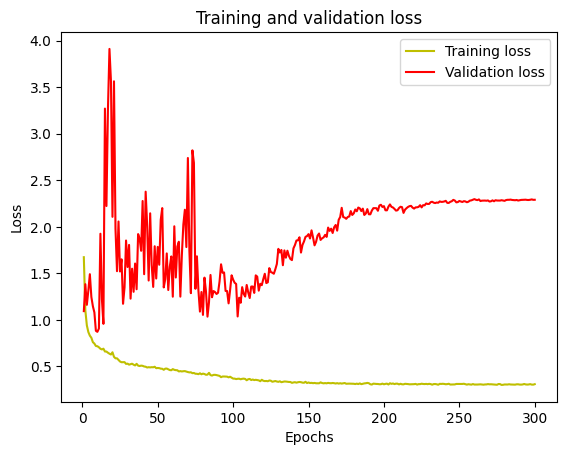

In [11]:
#plot the training and validation accuracy and loss at each epoch
loss = history['loss']
val_loss = history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [12]:
history.keys()

dict_keys(['loss', 'binary_crossentropy', 'binary_focal_crossentropy', 'bce_dice_loss', 'jacc_coef', 'auc', 'val_loss', 'val_binary_crossentropy', 'val_binary_focal_crossentropy', 'val_bce_dice_loss', 'val_jacc_coef', 'val_auc', 'lr'])

## Weights from checkpoint

In [9]:
# Upload the last checkpoint
latest = tf.train.latest_checkpoint(ckpt_dir)

# Create a new model instance(you need to choose the right architecture for the model you are loading)
# model = create_model(model_name='deep_lab_v3_plus', IMG_HEIGHT=256 , IMG_WIDTH=256, IMG_CHANNELS=3)
model = create_model(model_name='cloud_net')

# Load the previously saved weights
model.load_weights(latest)

2023-08-27 09:14:47.209277: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-27 09:14:47.706704: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22311 MB memory:  -> device: 2, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:c1:00.0, compute capability: 8.6


# Scoring
In this section it is possible to score the model of three diffrent sets of unseen images to assert generalization performances:
- SPARCS
- Biome
- 95 Clouds(without edge patches)

---

## Model Scoring on Different Datasets

In this section, we perform model scoring on three distinct sets of unseen images to assess the generalization performance of the trained deep learning model. The datasets we evaluate the model on include:

- **SPARCS**

- **Biome8**

- **95 Clouds (without edge patches)**

### Data Loading and Prediction

- For the SPARCS dataset, we load the data using generators and then make predictions on the train, validation, and test subsets. True labels are collected for each of these subsets.

- The Biome8 dataset is similarly processed, with predictions made for train, validation, and test data. True labels are gathered using generators.

- The 95 Clouds dataset is loaded, and predictions are made on a specified number of images. Options are available to customize data preprocessing, including resizing and exclusion of edge patches.

### Threshold Selection

The code also provides an option to search for the best threshold for the validation set. The threshold determines the decision boundary for binary classification.

### Results and Model Evaluation

Following prediction, the code evaluates the model's performance on each dataset using metrics such as accuracy, Jaccard Score (IoU), and the Receiver Operating Characteristic (ROC) curve.

This section serves as a comprehensive evaluation of the trained model's ability to generalize to different unseen datasets, offering insights into its segmentation performance and providing metrics for assessment.

By examining the model's performance on various datasets, you can gain a deeper understanding of its capabilities and make informed decisions regarding its deployment in different real-world scenarios.

---

## Data loading

In [13]:
def load_sparcs():
    # Create two instances of the test generator
    train_gen_pred = get_SPARCS_generator('train', batch_size=batch_size, only_rgb=trained_with_RGB)
    val_gen_pred = get_SPARCS_generator('valid', batch_size=batch_size, only_rgb=trained_with_RGB)
    test_gen_pred = get_SPARCS_generator('test', batch_size=batch_size, only_rgb=trained_with_RGB)

    train_image_names = sorted(os.listdir(Path(sparcs_train_dir, "images_p/")))
    val_image_names = sorted(os.listdir(Path(sparcs_valid_dir, "images_p/")))
    test_image_names = sorted(os.listdir(Path(sparcs_test_dir, "images_p/")))

    # Define number of steps
    train_steps = math.ceil(len(train_image_names) / batch_size)
    val_steps = math.ceil(len(val_image_names) / batch_size)
    test_steps = math.ceil(len(test_image_names) / batch_size)

    # Predict on the train, val and test data
    y_pred_train = model.predict(train_gen_pred, steps=train_steps, verbose=0)
    y_pred_val = model.predict(val_gen_pred, steps=val_steps, verbose=0)
    y_pred_test = model.predict(test_gen_pred, steps=test_steps, verbose=0)

    # Collect true labels
    y_true_train = get_SPARCS('train', only_rgb=trained_with_RGB)[1]
    y_true_val = get_SPARCS('valid', only_rgb=trained_with_RGB)[1]
    y_true_test = get_SPARCS('test', only_rgb=trained_with_RGB)[1]

    # print(y_true_train.shape, y_pred_train.shape)
    # print(y_true_val.shape, y_pred_val.shape)
    # print(y_true_test.shape, y_pred_test.shape)

    return y_true_train, y_pred_train, y_true_val, y_pred_val, y_true_test, y_pred_test


# def load_S2():
#     s2_test = get_S2(only_rgb=trained_with_RGB)
#     y_true_S2 = s2_test[1]
#     X = s2_test[0]

#     if need_resizing:
#         y_true_S2 = resize_image(y_true_S2, new_dim=((212, 256, 256, 1)))
#         X = resize_image(s2_test[0], new_dim=((212, 256, 256, 3))) if trained_with_RGB else resize_image(s2_test[0], new_dim=((212, 256, 256, 4)))

#     y_pred_S2 = model.predict(X)
#     print(y_true_S2.shape, y_pred_S2.shape)

#     return y_true_S2, y_pred_S2

# def load_s2():
#     # Create instances of the test generator
#     train_gen_pred = get_S2_generator('train', only_rgb=trained_with_RGB)
#     val_gen_pred = get_S2_generator('valid', only_rgb=trained_with_RGB)
#     test_gen_pred = get_S2_generator('test', only_rgb=trained_with_RGB)

#     train_image_names = sorted(os.listdir(Path(s2_train_dir, "images/")))
#     val_image_names = sorted(os.listdir(Path(s2_valid_dir, "images/")))
#     test_image_names = sorted(os.listdir(Path(s2_test_dir, "images/")))

#     # Define number of steps
#     train_steps = math.ceil(len(train_image_names) / batch_size)
#     val_steps = math.ceil(len(val_image_names) / batch_size)
#     test_steps = math.ceil(len(test_image_names) / batch_size)

#     # Predict on the train, val and test data
#     y_pred_train = model.predict(train_gen_pred, steps=train_steps)
#     y_pred_val = model.predict(val_gen_pred, steps=val_steps)
#     y_pred_test = model.predict(test_gen_pred, steps=test_steps)

#     # Collect true labels
#     y_true_train = get_S2('train', only_rgb=trained_with_RGB)[1]
#     y_true_val = get_S2('valid', only_rgb=trained_with_RGB)[1]
#     y_true_test = get_S2('test', only_rgb=trained_with_RGB)[1]

#     print(y_true_train.shape, y_pred_train.shape)
#     print(y_true_val.shape, y_pred_val.shape)
#     print(y_true_test.shape, y_pred_test.shape)

#     return y_true_train, y_pred_train, y_true_val, y_pred_val, y_true_test, y_pred_test


def collect_labels(generator, steps):
    y_true = []
    for i in range(steps):
        _, batch_y = next(generator)
        y_true.extend(batch_y)
    return np.array(y_true)

def load_biome8():
    # Create instances of the train, validation and test generators
    train_gen_pred = get_biome8_generator('train', batch_size=batch_size, only_rgb=trained_with_RGB)
    val_gen_pred = get_biome8_generator('valid', batch_size=batch_size, only_rgb=trained_with_RGB)
    test_gen_pred = get_biome8_generator('test', batch_size=batch_size, only_rgb=trained_with_RGB)

    train_gen_true = get_biome8_generator('train', batch_size=batch_size, only_rgb=trained_with_RGB)
    val_gen_true = get_biome8_generator('valid', batch_size=batch_size, only_rgb=trained_with_RGB)
    test_gen_true = get_biome8_generator('test', batch_size=batch_size, only_rgb=trained_with_RGB)

    train_image_names = sorted(os.listdir(Path(biome_train_dir, "images_p/")))
    val_image_names = sorted(os.listdir(Path(biome_valid_dir, "images_p/")))
    test_image_names = sorted(os.listdir(Path(biome_test_dir, "images_p/")))

    # Define number of steps
    train_steps = math.ceil(len(train_image_names) / batch_size)
    val_steps = math.ceil(len(val_image_names) / batch_size)
    test_steps = math.ceil(len(test_image_names) / batch_size)

    # Predict on the train, validation and test data
    y_pred_train = model.predict(train_gen_pred, steps=train_steps, verbose=0)
    y_pred_val = model.predict(val_gen_pred, steps=val_steps, verbose=0)
    y_pred_test = model.predict(test_gen_pred, steps=test_steps, verbose=0)

    # Collect true labels
    y_true_train = collect_labels(train_gen_true, train_steps)
    y_true_val = collect_labels(val_gen_true, val_steps)
    y_true_test = collect_labels(test_gen_true, test_steps)

    # print(y_true_train.shape, y_pred_train.shape)
    # print(y_true_val.shape, y_pred_val.shape)
    # print(y_true_test.shape, y_pred_test.shape)

    return y_true_train, y_pred_train, y_true_val, y_pred_val, y_true_test, y_pred_test


def load_cloud95(include_nir=True, invert_rgb=True, exclude_edge_patches=True, resize_to=256, for_visual_scoring=False):
    
    dataset = Cloud95Dataset(Cloud95_additional/'train_red_additional_to38cloud', 
                             Cloud95_additional/'train_green_additional_to38cloud', 
                             Cloud95_additional/'train_blue_additional_to38cloud', 
                             Cloud95_additional/'train_nir_additional_to38cloud',
                             Cloud95_additional/'train_gt_additional_to38cloud')
    
    # X = np.array([dataset.open_as_array(idx, include_nir=include_nir, invert_rgb=invert_rgb).astype(np.float32) for idx in range(len(dataset))])
    # y = np.array([dataset.open_mask(idx, add_dims=True).astype(np.int32) for idx in range(len(dataset))])
    
#     if for_visual_scoring:
#         X = np.array([dataset.open_as_array(idx, include_nir=False, false_color_aug=False, invert_rgb=False).astype(np.float32) for idx in range(len(dataset))])
#         y = np.array([dataset.open_mask(idx, add_dims=True).astype(np.int32) for idx in range(len(dataset))])
#     else:
#         X = np.array([dataset.open_as_array(idx, include_nir=include_nir, invert_rgb=invert_rgb).astype(np.float32) for idx in range(len(dataset))])
#         y = np.array([dataset.open_mask(idx, add_dims=True).astype(np.int32) for idx in range(len(dataset))])
        
    if for_visual_scoring:
        X = np.array([dataset.open_as_array(idx, include_nir=False, false_color_aug=False, invert_rgb=False).astype(np.float32) for idx in range(3000)])
        y = np.array([dataset.open_mask(idx, add_dims=True).astype(np.int32) for idx in range(len(dataset))])
    else:
        X = np.array([dataset.open_as_array(idx, include_nir=include_nir, invert_rgb=invert_rgb).astype(np.float32) for idx in range(3000)])
        y = np.array([dataset.open_mask(idx, add_dims=True).astype(np.int32) for idx in range(len(dataset))])
        
    
    if exclude_edge_patches:
        non_zero_idxs = [index for index, img in enumerate(X) if not np.any(img == 0)]
        X, y = X[non_zero_idxs], y[non_zero_idxs]
    
    if need_resizing:
        X = resize_image(X, new_dim=((X.shape[0], resize_to, resize_to, X.shape[-1])))
        y = resize_image(y, new_dim=((y.shape[0], resize_to, resize_to, y.shape[-1])))
        
    # print(X.shape, y.shape)
    
    # X = X[:3000]
    # y = y[:3000]
        
    return X, y


def predict_cloud95(X, threshold):
    preds = []
    for x in X:
        y_pred = model.predict(X, verbose=0)
        preds.append(y_pred)
        
    preds = np.array(preds)
    
    # Apply threshold
    y_pred_binary = (preds > threshold).astype(np.uint8)
    
    # print(X.shape, preds.shape, y_pred_binary.shape)

    return y_pred_binary

## Results

In [14]:
# y_true_train, y_pred_train, y_true_val, y_pred_val, y_true_test, y_pred_test = load_sparcs()
y_true_train, y_pred_train, y_true_val, y_pred_val, y_true_test, y_pred_test = load_sparcs()


# print(f"\nSearching best threshold for validation set:")
# threshold = find_best_threshold(y_pred_val, y_true_val)

threshold = 0.5

print(f"\nTrain set scores: ")
y_pred_train_binary = (y_pred_train > threshold).astype(np.uint8)
print_metrics(y_true_train, y_pred_train_binary)

print(f"\nValidation set scores: ")
y_pred_val_binary = (y_pred_val > threshold).astype(np.uint8)
print_metrics(y_true_val, y_pred_val_binary)

print(f"\nTest set scores: ")
y_pred_test_binary = (y_pred_test > threshold).astype(np.uint8)
print_metrics(y_true_test, y_pred_test_binary)


2023-08-27 20:17:39.561968: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100



Train set scores: 
Pixel Accuracy:  0.4076
Precision:  0.2521
Recall:  0.9891
F1 Score:  0.4018
AUC Score:  0.6251
-------------------------------------
Dice Coefficient:  0.4018
Jaccard Score (IoU):  0.2514
-------------------------------------
Overall Accuracy 0.2514
Average Jaccard Index 0.4076

Validation set scores: 
Pixel Accuracy:  0.4634
Precision:  0.2384
Recall:  0.9645
F1 Score:  0.3823
AUC Score:  0.6619
-------------------------------------
Dice Coefficient:  0.3823
Jaccard Score (IoU):  0.2363
-------------------------------------
Overall Accuracy 0.2363
Average Jaccard Index 0.4634

Test set scores: 
Pixel Accuracy:  0.4555
Precision:  0.2173
Recall:  0.9892
F1 Score:  0.3563
AUC Score:  0.6744
-------------------------------------
Dice Coefficient:  0.3563
Jaccard Score (IoU):  0.2168
-------------------------------------
Overall Accuracy 0.2168
Average Jaccard Index 0.4555


In [15]:
# y_true_train, y_pred_train, y_true_val, y_pred_val, y_true_test, y_pred_test = load_biome8()
y_true_train, y_pred_train, y_true_val, y_pred_val, y_true_test, y_pred_test = load_biome8()

# print(f"\nSearching best threshold for validation set:")
# threshold = find_best_threshold(y_pred_val, y_true_val)

# print(f"\nTrain set scores: ")
# y_pred_train_binary = (y_pred_train > threshold).astype(np.uint8)
# print_metrics(y_true_train, y_pred_train_binary)

# print(f"\nValidation set scores: ")
# y_pred_val_binary = (y_pred_val > threshold).astype(np.uint8)
# print_metrics(y_true_val, y_pred_val_binary)

print(f"\nTest set scores: ")
y_pred_test_binary = (y_pred_test > threshold).astype(np.uint8)
print_metrics(y_true_test, y_pred_test_binary)



Test set scores: 
Pixel Accuracy:  0.6555
Precision:  0.6134
Recall:  0.9992
F1 Score:  0.7601
AUC Score:  0.6203
-------------------------------------
Dice Coefficient:  0.7601
Jaccard Score (IoU):  0.6131
-------------------------------------
Overall Accuracy 0.6131
Average Jaccard Index 0.6555


In [16]:
# Specify threshold
threshold = 0.5

include_nir = invert_rgb = not trained_with_RGB
X, y_true = load_cloud95(include_nir=include_nir, invert_rgb=invert_rgb, exclude_edge_patches=True)

y_pred = model.predict(X, verbose=0)
# Apply threshold
y_pred_binary = (y_pred > threshold).astype(np.uint8)

# y_pred_binary = predict_cloud95(X, threshold)

In [17]:
print_metrics(y_true, y_pred_binary)

Pixel Accuracy:  0.5174
Precision:  0.4964
Recall:  0.9975
F1 Score:  0.6629
AUC Score:  0.5396
-------------------------------------
Dice Coefficient:  0.6629
Jaccard Score (IoU):  0.4958
-------------------------------------
Overall Accuracy 0.4958
Average Jaccard Index 0.5174


# Visual scoring
Here there is the possibility to perform a visual scoring on some unseen images and visually attest how good the model is masking the clouds.

---

## Visual Scoring for Cloud Detection

In this section, we perform visual scoring to assess the model's ability to accurately detect clouds in images from different datasets. This visual scoring includes four main datasets:

1. **SPARCS**

2. **S2 (Sentinel-2)**

3. **Biome8**

4. **95 Clouds**

### Data Preparation and Visual Scoring

- Images and masks from each dataset are prepared for scoring, and if needed, resizing is applied to ensure consistency.

- For each dataset, predictions are made using the trained model.

### Visualization of Results

The code provides visualizations of the results for each dataset. The visualizations include comparisons of RGB images, true masks, and predicted masks. Additionally, the RGB images are overlaid with predicted masks to provide a visual representation of cloud detection.

### Result Storage

The results of visual scoring, including images with masks and overlaid visualizations, are saved in the 'results' for later reference.

This section aims to provide a qualitative assessment of the model's cloud detection performance, allowing for visual confirmation of its accuracy on different datasets.

---

Notes:
- The Sentine-2 dataset is only used in the visual scoring, since the masks have a lower qualty with respect to the other datasets. So not to have a bad evaluation of the model, it is not used in the quantitative scoring.

In [18]:
def overlay(
    image: np.ndarray,
    mask: np.ndarray,
    color: Tuple[int, int, int] = (1, 0, 0),
    alpha: float = 0.5, 
    resize: Tuple[int, int] = None
) -> np.ndarray:
    """Combines image and its segmentation mask into a single image.
    
    Params:
        image: Training image.
        mask: Segmentation mask.
        color: Color for segmentation mask rendering.
        alpha: Segmentation mask's transparency.
        resize: If provided, both image and its mask are resized before blending them together.
    
    Returns:
        image_combined: The combined image.
        
    """
    color = np.asarray(color).reshape(1, 1, 3)  # Change color channel position
    colored_mask = np.expand_dims(mask, -1) * color
    image_overlay = image.copy()  # Make a copy of the image
    
    # Apply the overlay to the image
    image_overlay[mask > 0] = (1 - alpha) * image_overlay[mask > 0] + alpha * colored_mask[mask > 0]
    
    if resize is not None:
        image = cv.resize(image, resize[::-1])  # Reverse the order for resizing
        image_overlay = cv.resize(image_overlay, resize[::-1])
    
    image_combined = cv.addWeighted(image, 1 - alpha, image_overlay, alpha, 0)
    
    return image_combined

# cut_overlay = overlay(tiff_image[:, y0:y1, x0:x1], tiff_mask[y0:y1, x0:x1], alpha=0.4)
# ax.imshow(cut_overlay);

In [19]:
import os
import numpy as np
from skimage import io, img_as_ubyte
import matplotlib.pyplot as plt

# Assuming you have an array of original images (ims) and an array of predicted masks (preds)
def save_images(ims: np.ndarray, preds: np.ndarray, dataset: str = None) -> None:
    output_folder = results_path / model_name / dataset
    print(output_folder)
    os.makedirs(output_folder, exist_ok=True)
    
    for i, (original_image, predicted_mask) in enumerate(zip(ims, preds)):
        # print(original_image.shape, predicted_mask.shape)
        
        overlay_image = overlay(original_image, mask=np.squeeze(predicted_mask), alpha=0.5)
        
        # Convert images to uint8
        predicted_mask = (predicted_mask * 255).astype(np.uint8)
        overlay_image = (overlay_image * 255).astype(np.uint8)
        original_image = (original_image * 255).astype(np.uint8)

        # Save the original image
        original_image_filename = os.path.join(output_folder, f'img_{i}_im.png')
        io.imsave(original_image_filename, original_image, check_contrast=False)

        # Save the overlay image
        overlay_image_filename = os.path.join(output_folder, f'img_{i}_over.png')
        io.imsave(overlay_image_filename, overlay_image, check_contrast=False)

        # Save the predicted mask
        mask_filename = os.path.join(output_folder, f'img_{i}_pred.png')
        cv.imwrite(mask_filename, predicted_mask)

In [20]:
def predict_array(images):
    preds = []
    for img in images:
        img = np.expand_dims(img, axis=0)
        mask_pred = model.predict(img, verbose=0)
        mask_pred = (mask_pred > 0.5).astype(np.uint8)
        preds.append(mask_pred[0])
    return np.array(preds)

## Data loading

In [21]:
dataset = Cloud95Dataset(Cloud95_additional/'train_red_additional_to38cloud', 
                             Cloud95_additional/'train_green_additional_to38cloud', 
                             Cloud95_additional/'train_blue_additional_to38cloud', 
                             Cloud95_additional/'train_nir_additional_to38cloud',
                             Cloud95_additional/'train_gt_additional_to38cloud')

if need_resizing:
    images, masks = get_SPARCS('test', full_image=True, only_rgb=True, binary=True, resize_to=256)
    X_sp, _ = get_SPARCS('test', full_image=True, binary=True, only_rgb=trained_with_RGB, resize_to=256)
    
    S2_images, S2_masks = get_S2('test', only_rgb=True, resize_to=256)
    X_s2, _ = get_S2('test', only_rgb=trained_with_RGB, resize_to=256)
    
    biome_images, biome_masks = get_biome8('test', only_rgb=True, full_image=True, resize_to=256)
    X_b8, _ = get_biome8('test', only_rgb=trained_with_RGB, full_image=True, resize_to=256)
    


    # new_size = 256
    # include_nir = False if trained_with_RGB else True
    # c95_images = np.array([dataset.open_as_array(idx, include_nir=False, false_color_aug=True, invert_rgb=False).astype(np.float32) for idx in idxs])
    # c95_images = resize_image(c95_images, new_dim=((c95_images.shape[0], new_size, new_size, c95_images.shape[-1])))
    # c95_masks = np.array([dataset.open_mask(idx, add_dims=True).astype(np.int32) for idx in idxs])
    # c95_masks = resize_image(c95_masks, new_dim=((c95_masks.shape[0], new_size, new_size, c95_masks.shape[-1])))
    # X_c95 = np.array([dataset.open_as_array(idx, include_nir=include_nir).astype(np.float32) for idx in idxs])
    # X_c95 = resize_image(X_c95, new_dim=((X_c95.shape[0], new_size, new_size, X_c95.shape[-1])))

else:
    
    images, masks = get_SPARCS('test', full_image=True, only_rgb=True, binary=True)
    X_sp, y = get_SPARCS('test', full_image=True, binary=True, only_rgb=trained_with_RGB)
    
    S2_images, S2_masks = get_S2('test', only_rgb=True)
    X_s2, _ = get_S2('test', only_rgb=trained_with_RGB)
    
    biome_images, biome_masks = get_biome8('test', only_rgb=True, full_image=True)
    X_b8, _ = get_biome8('test', only_rgb=trained_with_RGB, full_image=True)
    
    # include_nir = False if trained_with_RGB else True
    # c95_images = np.array([dataset.open_as_array(idx, include_nir=False, false_color_aug=True, invert_rgb=False).astype(np.float32) for idx in idxs])
    # c95_masks = np.array([dataset.open_mask(idx, add_dims=True).astype(np.int32) for idx in idxs])
    # X_c95 = np.array([dataset.open_as_array(idx, include_nir=include_nir).astype(np.float32) for idx in idxs])
    
c95_images, c95_masks = load_cloud95(exclude_edge_patches=True, for_visual_scoring=True)
include_nir = invert_rgb = not trained_with_RGB
X_c95, _ = load_cloud95(include_nir=include_nir, invert_rgb=invert_rgb, exclude_edge_patches=True)

np.random.seed(12)
idxs = np.random.randint(c95_images.shape[0], size=20)
c95_images = np.array([c95_images[idx] for idx in idxs])
c95_masks = np.array([c95_masks[idx] for idx in idxs])
X_c95 = np.array([X_c95[idx] for idx in idxs])

X_sp.shape, X_s2.shape, X_b8.shape, X_c95.shape, c95_images.shape, c95_masks.shape

Loading data: 100%|██████████| 16/16 [00:01<00:00, 10.96it/s]


((8, 1024, 1024, 4),
 (212, 512, 512, 4),
 (16, 1024, 1024, 4),
 (20, 384, 384, 4),
 (20, 384, 384, 3),
 (20, 384, 384, 1))

In [22]:
# for models in [..., ...]:
#     load_model(model_name)
    
#     preds = model.predict(X_sp)
#     preds = (preds > 0.5).astype(np.uint8)

#     y_pred_S2 = model.predict(X_s2)
#     y_pred_binary_S2 = (y_pred_S2 >= 0.5).astype(np.uint8)

#     # Use the predict method directly on the generator
#     biome_preds = model.predict(X_b8)
#     # Apply threshold
#     biome_preds = (biome_preds >= 0.5).astype(np.uint8)

#     c95_preds = model.predict(X_c95)
#     c95_preds = (c95_preds >= 0.5).astype(np.uint8)

# plt.subplot()

In [23]:
preds = predict_array(X_sp)
save_images(images, preds, 'SPARCS')

y_pred_binary_S2 = predict_array(X_s2)
# save_images(S2_images, y_pred_binary_S2, 'S2')

biome_preds = predict_array(X_b8)
save_images(biome_images, biome_preds, 'Biome')


c95_preds = predict_array(X_c95)
save_images(c95_images, c95_preds, '95Cloud')

preds.shape, y_pred_binary_S2.shape, biome_preds.shape, c95_preds.shape

/home/jupyter/notebooks/results/UNetPlusPlus_SPARCS_epochs300_batch16_RGBNIR/SPARCS
/home/jupyter/notebooks/results/UNetPlusPlus_SPARCS_epochs300_batch16_RGBNIR/Biome
/home/jupyter/notebooks/results/UNetPlusPlus_SPARCS_epochs300_batch16_RGBNIR/95Cloud


((8, 1024, 1024, 1),
 (212, 512, 512, 1),
 (16, 1024, 1024, 1),
 (20, 384, 384, 1))

In [24]:
# preds = model.predict(X_sp)
# preds = (preds > 0.5).astype(np.uint8)

# save_images(images, preds, 'SPARCS')

# y_pred_S2 = model.predict(X_s2)
# y_pred_binary_S2 = (y_pred_S2 >= 0.5).astype(np.uint8)

# # save_images(S2_images, y_pred_binary_S2, 'S2')

# # Use the predict method directly on the generator
# biome_preds = model.predict(X_b8)
# # Apply threshold
# biome_preds = (biome_preds >= 0.5).astype(np.uint8)

# save_images(biome_images, biome_preds, 'Biome')

# c95_preds = model.predict(X_c95)
# c95_preds = (c95_preds >= 0.5).astype(np.uint8)

# save_images(c95_images, c95_preds, '95Cloud')

# preds.shape, y_pred_binary_S2.shape, biome_preds.shape, c95_preds.shape

## Results

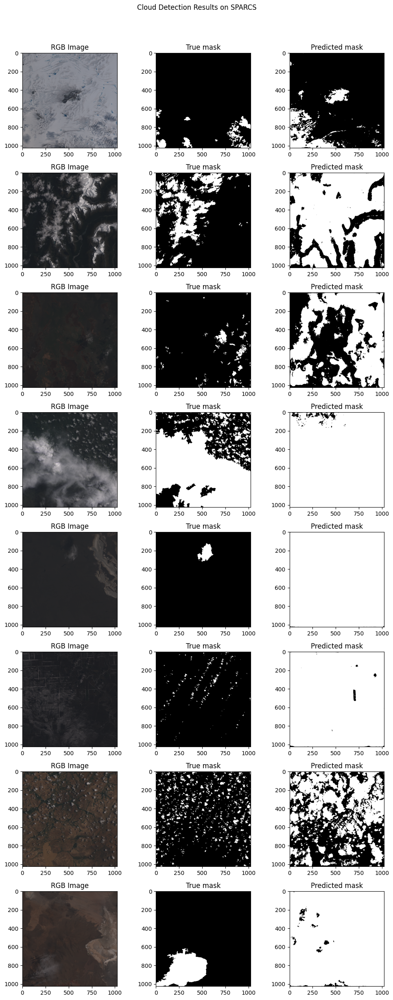

In [25]:
fig, ax = plt.subplots(len(images), 3, figsize=(10, 25))

res_dir = (results_path / model_name / 'SPARCS')
if not os.path.exists(res_dir):
        os.makedirs(res_dir, exist_ok=True)

for i, im in enumerate(images):
    # inputs, targets = test_list[idx]
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    ax[i, 1].imshow(masks[i], cmap='gray')
    ax[i, 1].set_title('True mask')
    ax[i, 2].imshow(preds[i], cmap='gray')
    ax[i, 2].set_title('Predicted mask')
    
# Add a title for the entire plot
plt.suptitle('Cloud Detection Results on SPARCS')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_1.png'))

# # Display the figure
plt.show()

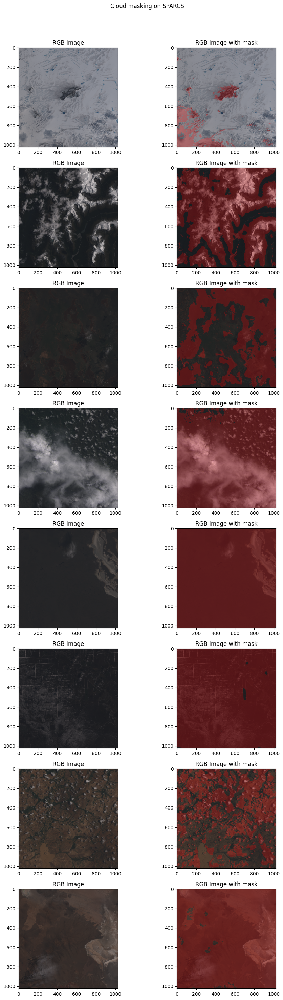

In [26]:
fig, ax = plt.subplots(len(images), 2, figsize=(10, 30))

for i, im in enumerate(images):
    # Remove singleton dimensions from preds[i]
    mask = np.squeeze(preds[i])
    
    # # Create an RGB mask where the masked region is light blue
    # rgb_mask = np.zeros((*mask.shape, 3))
    # rgb_mask[mask == 1] = [0, 0, 1]  # Light blue color for the mask
    
    cut_overlay = overlay(im, mask, alpha=0.5)
    
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    
    ax[i, 1].imshow(cut_overlay)
    # ax[i, 1].imshow(rgb_mask, alpha=0.3)  # Adjust alpha for desired transparency
    ax[i, 1].set_title('RGB Image with mask')
    
# Add a title for the entire plot
plt.suptitle('Cloud masking on SPARCS')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_2.png'))

# Display the figure
plt.show()

In [27]:
# fig, ax = plt.subplots(len(images), 2, figsize=(10, 30))

# for i, im in enumerate(images):
#     # Remove singleton dimensions from preds[i]
#     mask = np.squeeze(preds[i])
    
#     # Create an RGB mask where the masked region is light blue
#     rgb_mask = np.zeros((*mask.shape, 3))
#     rgb_mask[mask == 1] = [0, 0, 1]  # Light blue color for the mask
    
#     ax[i, 0].imshow(im)
#     ax[i, 0].set_title('RGB Image')
    
#     ax[i, 1].imshow(im)
#     ax[i, 1].imshow(rgb_mask, alpha=0.3)  # Adjust alpha for desired transparency
#     ax[i, 1].set_title('RGB Image with mask')
    
# # Add a title for the entire plot
# plt.suptitle('Cloud masking on SPARCS')

# # Adjust the spacing between subplots and from the top of the figure
# plt.tight_layout(rect=[0, 0, 1, 0.96])

# # Display the figure
# plt.show()

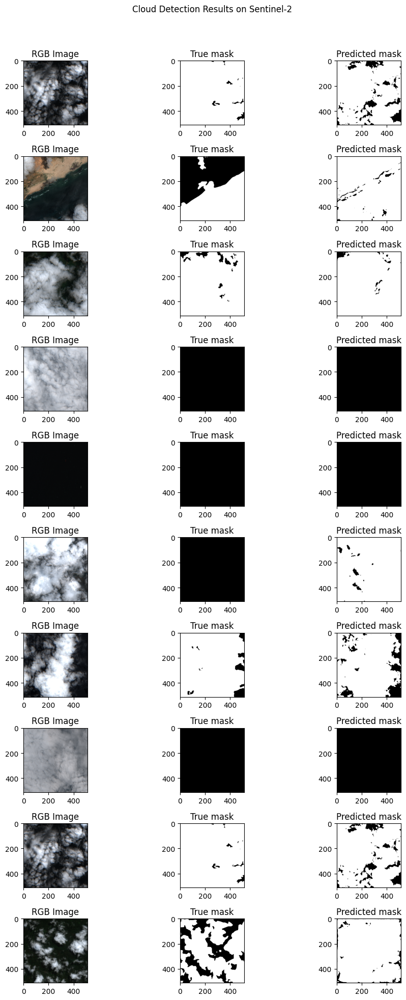

In [28]:
np.random.seed(seed_value)
idxs = np.random.randint(len(S2_images), size=10)

res_dir = (results_path / model_name / 'S2')
if not os.path.exists(res_dir):
        os.makedirs(res_dir, exist_ok=True)

fig, ax = plt.subplots(len(idxs), 3, figsize=(10, 20))

for i, idx in enumerate(idxs):
    ax[i, 0].imshow(S2_images[idx])
    ax[i, 0].set_title('RGB Image')
    ax[i, 1].imshow(S2_masks[idx], cmap='gray')
    ax[i, 1].set_title('True mask')
    ax[i, 2].imshow(y_pred_binary_S2[idx], cmap='gray')
    ax[i, 2].set_title('Predicted mask')

# Add a title for the entire plot
plt.suptitle('Cloud Detection Results on Sentinel-2')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_1.png'))

# # Display the figure
plt.show()

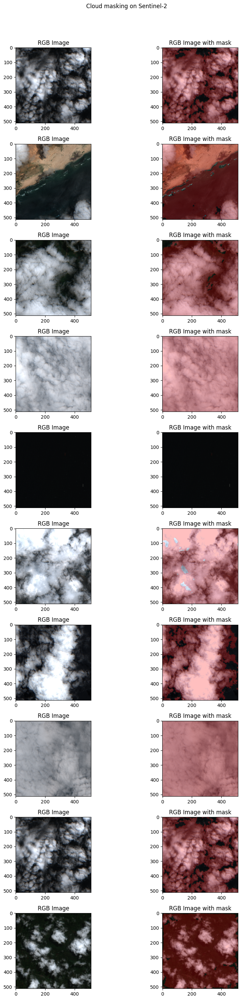

In [29]:
fig, ax = plt.subplots(len(idxs), 2, figsize=(10, 30))

for i, idx in enumerate(idxs):
    # Remove singleton dimensions from preds[i]
    mask = np.squeeze(y_pred_binary_S2[idx])
    
    # Create an RGB mask where the masked region is light blue
    # rgb_mask = np.zeros((*mask.shape, 3))
    # rgb_mask[mask == 1] = [0, 0, 1]  # Light blue color for the mask
    
    cut_overlay = overlay(S2_images[idx], mask, alpha=0.5)
    
    ax[i, 0].imshow(S2_images[idx])
    ax[i, 0].set_title('RGB Image')
    
    
    ax[i, 1].imshow(cut_overlay)
    # ax[i, 1].imshow(S2_images[idx])
    # ax[i, 1].imshow(rgb_mask, alpha=0.7)  # Adjust alpha for desired transparency
    ax[i, 1].set_title('RGB Image with mask')
    
# Add a title for the entire plot
plt.suptitle('Cloud masking on Sentinel-2')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_2.png'))

# Display the figure
plt.show()

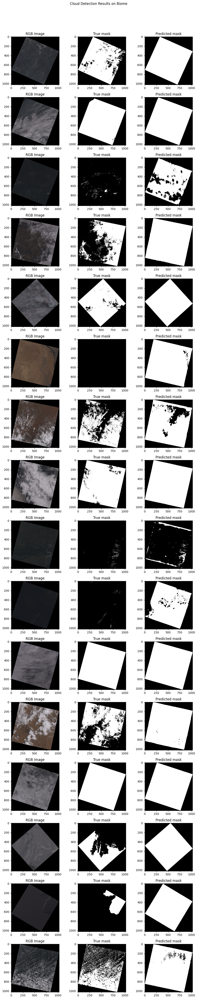

In [30]:
fig, ax = plt.subplots(len(biome_images), 3, figsize=(10, 50))

res_dir = (results_path / model_name / 'Biome')
if not os.path.exists(res_dir):
        os.makedirs(res_dir, exist_ok=True)

for i, im in enumerate(biome_images):
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    biome_masks[i][biome_masks[i] == 2] = 0
    ax[i, 1].imshow(biome_masks[i], cmap='gray')
    ax[i, 1].set_title('True mask')
    ax[i, 2].imshow(biome_preds[i], cmap='gray')
    ax[i, 2].set_title('Predicted mask')
    
# Add a title for the entire plot
plt.suptitle('Cloud Detection Results on Biome')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_1.png'))

# # Display the figure
plt.show()

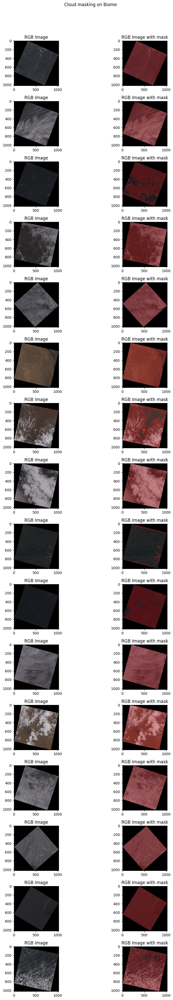

In [31]:
fig, ax = plt.subplots(len(biome_images), 2, figsize=(10, 40))

for i, im in enumerate(biome_images):
    # Remove singleton dimensions from preds[i]
    mask = np.squeeze(biome_preds[i])
    
    # Create an RGB mask where the masked region is light blue
    # rgb_mask = np.zeros((*mask.shape, 3))
    # rgb_mask[mask == 1] = [0, 0, 1]  # Light blue color for the mask
    cut_overlay = overlay(im, mask, alpha=0.5)
    
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    
    ax[i, 1].imshow(cut_overlay)
    # ax[i, 1].imshow(im)
    # ax[i, 1].imshow(rgb_mask, alpha=0.7)  # Adjust alpha for desired transparency
    ax[i, 1].set_title('RGB Image with mask')
    
# Add a title for the entire plot
plt.suptitle('Cloud masking on Biome')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_2.png'))

# Display the figure
plt.show()

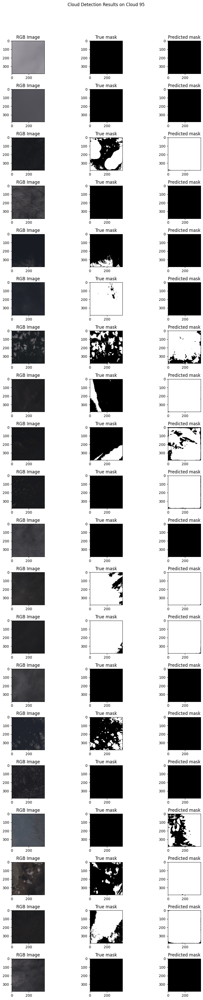

In [32]:
fig, ax = plt.subplots(len(c95_images), 3, figsize=(10, 40))

res_dir = (results_path / model_name / '95Cloud')
if not os.path.exists(res_dir):
        os.makedirs(res_dir, exist_ok=True)

for i, im in enumerate(c95_images):
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    ax[i, 1].imshow(c95_masks[i], cmap='gray')
    ax[i, 1].set_title('True mask')
    ax[i, 2].imshow(c95_preds[i], cmap='gray')
    ax[i, 2].set_title('Predicted mask')

# Add a title for the entire plot
plt.suptitle('Cloud Detection Results on Cloud 95')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_1.png'))

# # Display the figure
plt.show()

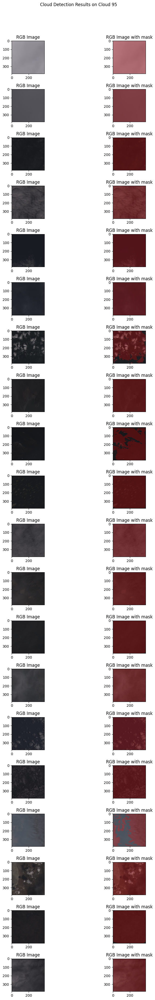

In [33]:
fig, ax = plt.subplots(len(c95_images), 2, figsize=(10, 40))

for i, im in enumerate(c95_images):
    
    mask = np.squeeze(c95_preds[i])
    
    cut_overlay = overlay(im, mask, alpha=0.5)
    
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    
    ax[i, 1].imshow(cut_overlay)
    ax[i, 1].set_title('RGB Image with mask')

    
# Add a title for the entire plot
plt.suptitle('Cloud Detection Results on Cloud 95')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_2.png'))

# # Display the figure
plt.show()